In [14]:
import os
import json
import re
import warnings
from collections import defaultdict
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

warnings.filterwarnings("ignore", category=UserWarning, module='tfrecord.iterator_utils')
warnings.filterwarnings("ignore", message="This figure includes Axes that are not compatible with tight_layout")

In [15]:
local_data_dir = "./downloaded_gcs_data/data_dhs/senegal_1992"
location_uid = "senegal_1992_00001"

Loading JSON metadata from: ./downloaded_gcs_data/data_dhs/senegal_1992\senegal_1992_00001.json

--- JSON Metadata (Summary) ---
Location UID (from config): senegal_1992_00001
Keys found: ['projection', 'patchDimensions', 'patchesPerRow', 'totalPatches']

Loading TFRecord data from: ./downloaded_gcs_data/data_dhs/senegal_1992\senegal_1992_00001.tfrecord.gz

Successfully loaded and parsed TFRecord using TensorFlow.
Found 88 raw features (bands * time).
Parsing feature keys...

Successfully parsed data.
Bands found: ['BLUE', 'GREEN', 'NIR', 'NL', 'RED', 'SWIR1', 'SWIR2', 'TEMP1']
Time spans found: ['1990_1992', '1993_1995', '1996_1998', '1999_2001', '2002_2004', '2005_2007', '2008_2010', '2011_2013', '2014_2016', '2017_2019', '2020_2020']

Generating combined band/time visualization grid...


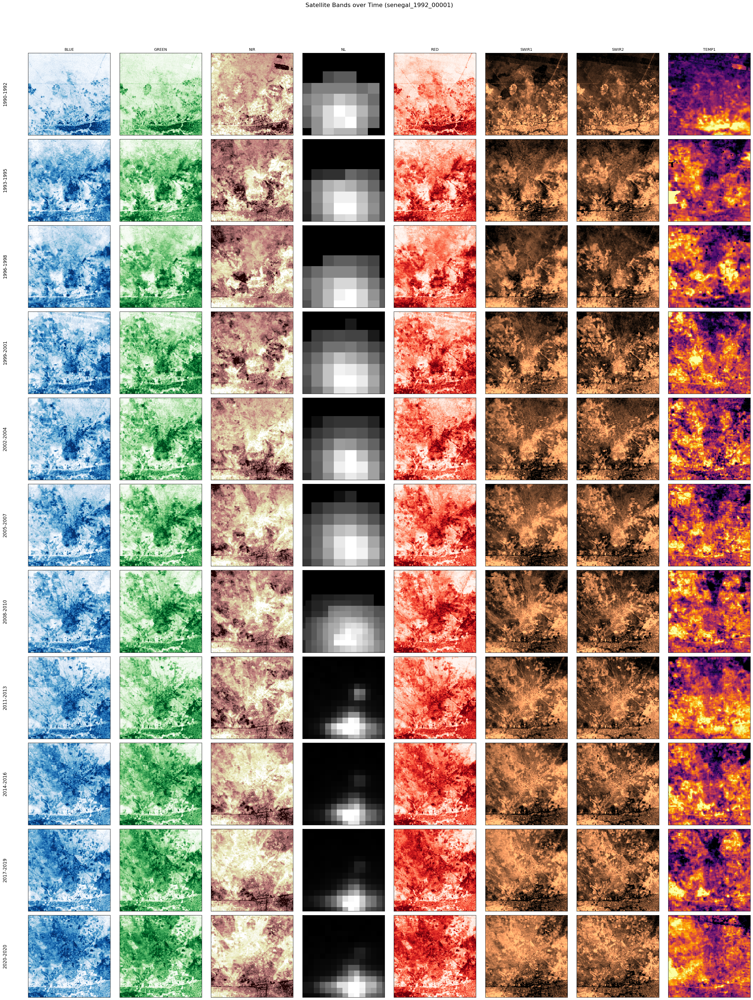


Generating RGB composites (if possible)...
Found 11 time spans with R, G, B data: ['1990_1992', '1993_1995', '1996_1998', '1999_2001', '2002_2004', '2005_2007', '2008_2010', '2011_2013', '2014_2016', '2017_2019', '2020_2020']


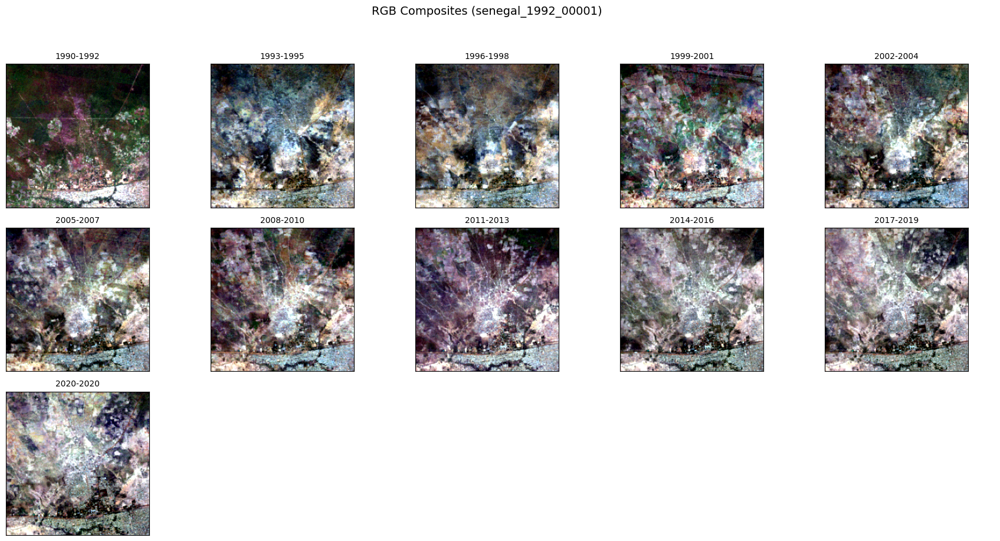

In [16]:
# --- Assuming Local Files ---
# Construct full paths (adjust if your naming convention differs)
json_path = os.path.join(local_data_dir, location_uid + ".json")
tfrecord_path = os.path.join(local_data_dir, location_uid + ".tfrecord.gz")

# Check if files exist
if not os.path.exists(json_path):
    print(f"Error: JSON file not found at {json_path}")
    print("Please ensure the file is downloaded and the location_uid/path is correct.")
    exit() # Exit if metadata is missing
elif not os.path.exists(tfrecord_path):
    print(f"Error: TFRecord file not found at {tfrecord_path}")
    print("Please ensure the file is downloaded and the location_uid/path is correct.")
    exit() # Exit if data is missing
else:
    # --- 1. Load JSON Metadata ---
    print(f"Loading JSON metadata from: {json_path}")
    try:
        with open(json_path, 'r') as f:
            metadata = json.load(f)
        print("\n--- JSON Metadata (Summary) ---")
        print(f"Location UID (from config): {location_uid}")
        print(f"Keys found: {list(metadata.keys())}")
    except Exception as e:
        print(f"Error loading or parsing JSON: {e}")
        metadata = {}

    # --- 2. Load and Parse TFRecord using TensorFlow ---
    print(f"\nLoading TFRecord data from: {tfrecord_path}")

    IMG_HEIGHT = 224
    IMG_WIDTH = 224
    EXPECTED_PIXELS = IMG_HEIGHT * IMG_WIDTH

    try:
        raw_dataset = tf.data.TFRecordDataset(tfrecord_path, compression_type='GZIP')
        
        try:
            serialized_example = next(iter(raw_dataset))
        except StopIteration:
            print(f"Error: TFRecord file {tfrecord_path} appears to be empty or corrupted.")
            exit()

        example = tf.train.Example()
        example.ParseFromString(serialized_example.numpy())
        feature_map = example.features.feature
        print(f"\nSuccessfully loaded and parsed TFRecord using TensorFlow.")
        print(f"Found {len(feature_map)} raw features (bands * time).")

        # --- 3. Extract, Parse Names, and Reshape Bands ---
        # Store as parsed_data[band_name][time_span] = image_data <-- CORRECTED COMMENT
        parsed_data = defaultdict(dict)
        all_feature_keys = list(feature_map.keys())

        band_pattern = re.compile(r".*_([A-Za-z0-9]+)_(\d{4})_(\d{4})$")

        print("Parsing feature keys...")
        bands_found = set()
        times_found = set()
        parse_errors = 0
        data_errors = 0

        for key in all_feature_keys:
            match = band_pattern.match(key)
            if match:
                band_name = match.group(1)
                time_span = f"{match.group(2)}_{match.group(3)}"
                feature = feature_map[key]

                if feature.float_list.value and len(feature.float_list.value) == EXPECTED_PIXELS:
                    flattened_pixels = np.array(feature.float_list.value, dtype=np.float32)
                    image_patch = flattened_pixels.reshape((IMG_HEIGHT, IMG_WIDTH))
                    # Assign using [band_name][time_span]
                    parsed_data[band_name][time_span] = image_patch
                    bands_found.add(band_name)
                    times_found.add(time_span)
                elif not feature.float_list.value:
                    image_patch = np.full((IMG_HEIGHT, IMG_WIDTH), np.nan, dtype=np.float32)
                    # Assign using [band_name][time_span]
                    parsed_data[band_name][time_span] = image_patch
                    bands_found.add(band_name)
                    times_found.add(time_span)
                else:
                    print(f"  Warning: Feature '{key}' has unexpected data length ({len(feature.float_list.value)} vs {EXPECTED_PIXELS}). Skipping.")
                    data_errors += 1
            else:
                print(f"  Warning: Feature key '{key}' did not match expected pattern. Skipping.")
                parse_errors += 1

        if not parsed_data:
            print("\nError: No bands were successfully parsed. Check TFRecord structure, naming convention, and parsing pattern.")
            print(f"Parsing errors: {parse_errors}, Data errors: {data_errors}")
            exit()
        else:
            print(f"\nSuccessfully parsed data.")
            sorted_bands = sorted(list(bands_found))
            sorted_times = sorted(list(times_found))
            print(f"Bands found: {sorted_bands}")
            print(f"Time spans found: {sorted_times}")

            # --- 4. Visualize Combined Grid (Bands x Time) ---
            print("\nGenerating combined band/time visualization grid...")

            nrows = len(sorted_times)
            ncols = len(sorted_bands)

            if nrows == 0 or ncols == 0:
                print("Error: No time spans or bands found to plot.")
                exit()

            fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 3.5, nrows * 3.5), squeeze=False)
            fig.suptitle(f"Satellite Bands over Time ({location_uid})", fontsize=16, y=0.99)

            for r, time_span in enumerate(sorted_times):
                for c, band_name in enumerate(sorted_bands):
                    ax = axes[r, c]

                    # *** CORRECTED CHECK AND ACCESS ***
                    # Check if data exists for this specific band/time combo
                    if band_name in parsed_data and time_span in parsed_data[band_name]:
                        # Access using [band_name][time_span]
                        img_data = parsed_data[band_name][time_span]

                        # Simple contrast stretch (percentile clip) - Robust to NaNs
                        valid_pixels = img_data[~np.isnan(img_data)]
                        if valid_pixels.size > 1:
                            p_low, p_high = 2, 98
                            vmin, vmax = np.percentile(valid_pixels, (p_low, p_high))
                            if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
                                vmin = np.nanmin(img_data)
                                vmax = np.nanmax(img_data)
                                if vmax <= vmin : vmax = vmin + 1e-6
                        elif valid_pixels.size == 1:
                            vmin = vmax = valid_pixels[0]
                            if vmin == 0: vmin, vmax = -0.1, 0.1
                            else: vmin *=0.9; vmax *=1.1
                        else: # All NaNs
                            vmin, vmax = 0, 1

                        # Determine colormap based on band name
                        cmap = 'viridis' # Default
                        if band_name == 'RED': cmap = 'Reds'
                        elif band_name == 'GREEN': cmap = 'Greens'
                        elif band_name == 'BLUE': cmap = 'Blues'
                        elif band_name == 'NL': cmap = 'gray'
                        elif band_name == 'TEMP1': cmap = 'inferno'
                        elif 'SWIR' in band_name: cmap = 'copper'
                        elif band_name == 'NIR': cmap = 'pink'

                        im = ax.imshow(img_data, cmap=cmap, vmin=vmin, vmax=vmax, interpolation='nearest')

                    else:
                        # Handle missing data (leave subplot blank with text)
                        ax.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=9, transform=ax.transAxes)
                        ax.set_facecolor('lightgrey')

                    # --- Set Titles and Labels ---
                    if r == 0:
                        ax.set_title(band_name, fontsize=10)
                    if c == 0:
                        ax.set_ylabel(time_span.replace('_', '-'), rotation=90, size='large', labelpad=20)
                        ax.yaxis.set_label_coords(-0.25, 0.5)

                    # --- Clean up axes ticks ---
                    ax.set_xticks([])
                    ax.set_yticks([])

            plt.tight_layout(rect=[0, 0.03, 1, 0.96])
            plt.show()


            # --- 5. Visualize RGB Composites (Optional Separate Plot) ---
            print("\nGenerating RGB composites (if possible)...")

            # *** CORRECTED LOGIC FOR FINDING RGB TIMES ***
            rgb_times = []
            # Check if R, G, B bands *exist* in the parsed data first
            if 'RED' in parsed_data and 'GREEN' in parsed_data and 'BLUE' in parsed_data:
                # Find the intersection of time spans available for all three bands
                common_times = set(parsed_data['RED'].keys()) & set(parsed_data['GREEN'].keys()) & set(parsed_data['BLUE'].keys())
                # Sort the common time spans
                rgb_times = sorted(list(common_times))
                print(f"Found {len(rgb_times)} time spans with R, G, B data: {rgb_times}")
            else:
                print("Could not generate RGB composites: One or more of RED, GREEN, BLUE bands not found in parsed data.")


            num_rgb_times = len(rgb_times)

            if num_rgb_times > 0:
                ncols_rgb = min(num_rgb_times, 5) # Max 5 columns for RGB
                nrows_rgb = (num_rgb_times + ncols_rgb - 1) // ncols_rgb
                fig_rgb, axes_rgb = plt.subplots(nrows_rgb, ncols_rgb, figsize=(ncols_rgb * 3.5, nrows_rgb * 3.2), squeeze=False)
                fig_rgb.suptitle(f"RGB Composites ({location_uid})", fontsize=14)
                axes_rgb_flat = axes_rgb.flatten()

                for i, time_span in enumerate(rgb_times):
                    try:
                        # *** CORRECTED DATA ACCESS ***
                        # Access using [band_name][time_span]
                        r = parsed_data['RED'][time_span]
                        g = parsed_data['GREEN'][time_span]
                        b = parsed_data['BLUE'][time_span]

                        # Stack bands: HxWx3
                        rgb_image = np.stack([r, g, b], axis=-1)

                        # Robust contrast stretch for visualization (handle NaNs per band)
                        p_low, p_high = 2, 98 # Percentile range
                        rgb_stretched = np.zeros_like(rgb_image, dtype=np.float32)

                        any_valid_pixels = False # Flag to check if any band has data
                        for band_idx in range(3):
                            band_data = rgb_image[:, :, band_idx]
                            valid_pixels = band_data[~np.isnan(band_data)]
                            if valid_pixels.size > 0:
                                any_valid_pixels = True
                                vmin, vmax = np.percentile(valid_pixels, (p_low, p_high))
                                if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin:
                                    vmin = np.nanmin(band_data)
                                    vmax = np.nanmax(band_data)
                                if vmax <= vmin: vmax = vmin + 1e-5

                                band_stretched = np.clip((band_data - vmin) / (vmax - vmin), 0.0, 1.0)
                                rgb_stretched[:, :, band_idx] = np.nan_to_num(band_stretched, nan=0.0) # Fill NaNs with 0 after stretch
                            else: # Handle all-NaN band
                                rgb_stretched[:, :, band_idx] = 0.0 # Fill with 0

                        # Display the stretched RGB image
                        ax_rgb = axes_rgb_flat[i]
                        if any_valid_pixels: # Only show image if there was some data
                            ax_rgb.imshow(rgb_stretched)
                        else: # Show 'No Data' if R, G, B were all NaN for this timespan
                            ax_rgb.text(0.5, 0.5, 'No Data', ha='center', va='center', fontsize=9, transform=ax_rgb.transAxes)
                            ax_rgb.set_facecolor('lightgrey')
                        ax_rgb.set_title(time_span.replace('_', '-'), fontsize=10)
                        ax_rgb.set_xticks([])
                        ax_rgb.set_yticks([])

                    except KeyError as e:
                         # This shouldn't happen with the corrected rgb_times logic, but as a safeguard:
                         print(f"  Internal Error: KeyError '{e}' occurred for time_span '{time_span}' during RGB plotting. Skipping this time span.")
                         ax_rgb = axes_rgb_flat[i]
                         ax_rgb.text(0.5, 0.5, 'Error', ha='center', va='center', fontsize=9, transform=ax_rgb.transAxes)
                         ax_rgb.set_facecolor('pink')
                         ax_rgb.set_title(f"{time_span.replace('_', '-')}\n(Error)", fontsize=9)
                         ax_rgb.set_xticks([])
                         ax_rgb.set_yticks([])


                # Hide unused RGB subplots
                for j in range(num_rgb_times, len(axes_rgb_flat)):
                    axes_rgb_flat[j].axis('off')

                plt.tight_layout(rect=[0, 0.03, 1, 0.95])
                plt.show()
            # No explicit 'else' needed here, message printed when rgb_times is calculated

    except ImportError as e:
        print(f"Error: Missing required library. {e}")
        print("Try: pip install tensorflow numpy matplotlib")
    except FileNotFoundError as e:
         print(f"Error: File not found. {e}")
    except Exception as e:
        print(f"An unexpected error occurred while processing {tfrecord_path}: {e}")
        import traceback
        traceback.print_exc()

## NL data for IM


Loading TFRecord data from: ./downloaded_gcs_data/senegal_NL/senegal_1992\senegal_1992_00001.tfrecord.gz
Successfully loaded and parsed TFRecord.
Found 1 feature with key: '2_1990_1992_NL_1990_1992'
Feature length matches expected pixels (147456). Reshaping...
Successfully extracted and reshaped NL image patch.

--- NL Image Patch Statistics ---
Min Value: 0.0
Max Value: 14.0
Mean Value: 2.0306804180145264
--------------------------------

Generating NL visualization...


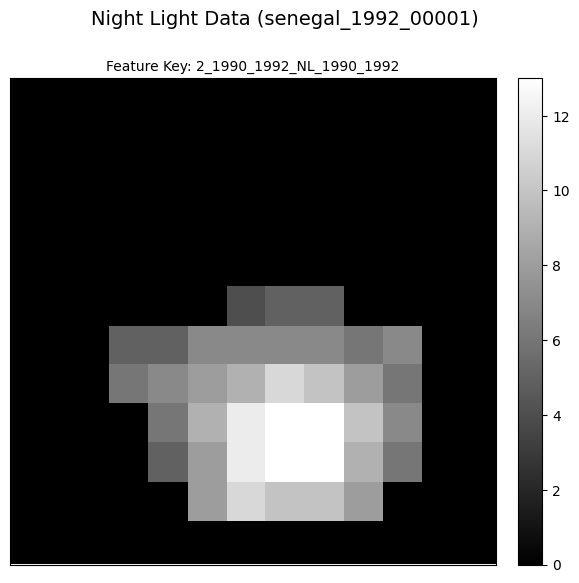

In [13]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import json
from collections import defaultdict # Keep for potential future use, but not strictly needed now

# --- Configuration ---
local_data_dir = "./downloaded_gcs_data/senegal_NL/senegal_1992"
location_uid = "senegal_1992_00001" # Example UID

# --- !!! CORRECTED Image dimensions based on error log !!! ---
IMG_HEIGHT = 384
IMG_WIDTH = 384
EXPECTED_PIXELS = IMG_HEIGHT * IMG_WIDTH # Should now be 147456

# --- File Paths ---
tfrecord_path = os.path.join(local_data_dir, location_uid + ".tfrecord.gz")

# --- Check if file exists ---
if not os.path.exists(tfrecord_path):
    print(f"Error: TFRecord file not found at {tfrecord_path}")
    exit()

# --- Load and Parse TFRecord ---
print(f"\nLoading TFRecord data from: {tfrecord_path}")
try:
    raw_dataset = tf.data.TFRecordDataset(tfrecord_path, compression_type='GZIP')

    try:
        # Get the first (and likely only) serialized example
        serialized_example = next(iter(raw_dataset))
    except StopIteration:
        print(f"Error: TFRecord file {tfrecord_path} appears to be empty.")
        exit()

    # Parse the tf.train.Example proto
    example = tf.train.Example()
    example.ParseFromString(serialized_example.numpy())
    feature_map = example.features.feature
    print(f"Successfully loaded and parsed TFRecord.")

    # --- Extract the Single Feature ---
    nl_image_patch = None
    feature_key = None

    if len(feature_map) == 1:
        feature_key = list(feature_map.keys())[0]
        print(f"Found 1 feature with key: '{feature_key}'")
        feature = feature_map[feature_key]

        if feature.float_list.value and len(feature.float_list.value) == EXPECTED_PIXELS:
            print(f"Feature length matches expected pixels ({EXPECTED_PIXELS}). Reshaping...")
            flattened_pixels = np.array(feature.float_list.value, dtype=np.float32)
            # Reshape directly to H x W (assuming only 1 band was exported)
            nl_image_patch = flattened_pixels.reshape((IMG_HEIGHT, IMG_WIDTH))
            print("Successfully extracted and reshaped NL image patch.")
        elif not feature.float_list.value:
             print("Warning: The feature contains no pixel data (empty float_list).")
             nl_image_patch = np.full((IMG_HEIGHT, IMG_WIDTH), np.nan, dtype=np.float32) # Create NaN image
        else:
            print(f"Error: Feature '{feature_key}' has unexpected data length ({len(feature.float_list.value)} vs {EXPECTED_PIXELS}). Cannot reshape correctly.")
            # Exit or handle error appropriately
            exit()
    elif len(feature_map) == 0:
         print("Error: No features found in the TFRecord.")
         exit()
    else:
        print(f"Error: Expected 1 feature, but found {len(feature_map)}. Keys: {list(feature_map.keys())}")
        print("The parsing logic needs adjustment for multiple features.")
        exit()

    
    # --- Calculate and Print Statistics (if patch exists) --- <<< ADD CODE HERE
    if nl_image_patch is not None:
        print("\n--- NL Image Patch Statistics ---")
        try:
            min_val = np.nanmin(nl_image_patch)
            max_val = np.nanmax(nl_image_patch)
            mean_val = np.nanmean(nl_image_patch)
            print(f"Min Value: {min_val}")
            print(f"Max Value: {max_val}")
            print(f"Mean Value: {mean_val}")
        except Exception as stats_error:
             # This might happen if the array contains only NaNs after masking etc.
             print(f"Could not calculate statistics (possibly all NaN values): {stats_error}")
             print(f"Min Value: N/A")
             print(f"Max Value: N/A")
             print(f"Mean Value: N/A")
        print("--------------------------------")


    # --- Visualize the Single NL Image Patch ---
    if nl_image_patch is not None:
        print("\nGenerating NL visualization...")

        fig, ax = plt.subplots(1, 1, figsize=(6, 6)) # Single plot
        fig.suptitle(f"Night Light Data ({location_uid})", fontsize=14)

        # Determine plot limits using percentile clipping (robust to NaNs/outliers)
        valid_pixels = nl_image_patch[~np.isnan(nl_image_patch)]
        if valid_pixels.size > 1:
            vmin, vmax = np.percentile(valid_pixels, (2, 98))
            if not np.isfinite(vmin) or not np.isfinite(vmax) or vmax <= vmin: # Handle edge cases
                 vmin = np.nanmin(nl_image_patch)
                 vmax = np.nanmax(nl_image_patch)
                 if vmax <= vmin: vmax = vmin + 1e-6 # Avoid zero range
        elif valid_pixels.size == 1: # Handle single valid pixel case
             vmin = vmax = valid_pixels[0]
             if vmin == 0: vmin, vmax = -0.1, 0.1
             else: vmin *=0.9; vmax *=1.1
        else: # All NaNs or empty
            vmin, vmax = 0, 1

        im = ax.imshow(nl_image_patch, cmap='gray', vmin=vmin, vmax=vmax, interpolation='nearest')
        plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04) # Add colorbar
        ax.set_title(f"Feature Key: {feature_key}", fontsize=10) # Show the key as title

        # Clean up axes ticks
        ax.set_xticks([])
        ax.set_yticks([])

        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()
    else:
        print("Could not extract NL image data for visualization.")


except ImportError as e:
    print(f"Error: Missing required library. {e}")
    print("Try: pip install tensorflow numpy matplotlib")
except FileNotFoundError as e:
     print(f"Error: File not found. {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")
    import traceback
    traceback.print_exc()